# **Task 2** - Reconstructing using Random Fourier Features (RFF)

***Part-A: Image Reconstruction Using Linear Regression and Random Fourier Features***

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.kernel_approximation import RBFSampler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [72]:
img = torchvision.io.read_image("/kaggle/input/assignment2-files/samvad.jpg")
print(img.shape)

torch.Size([3, 600, 800])


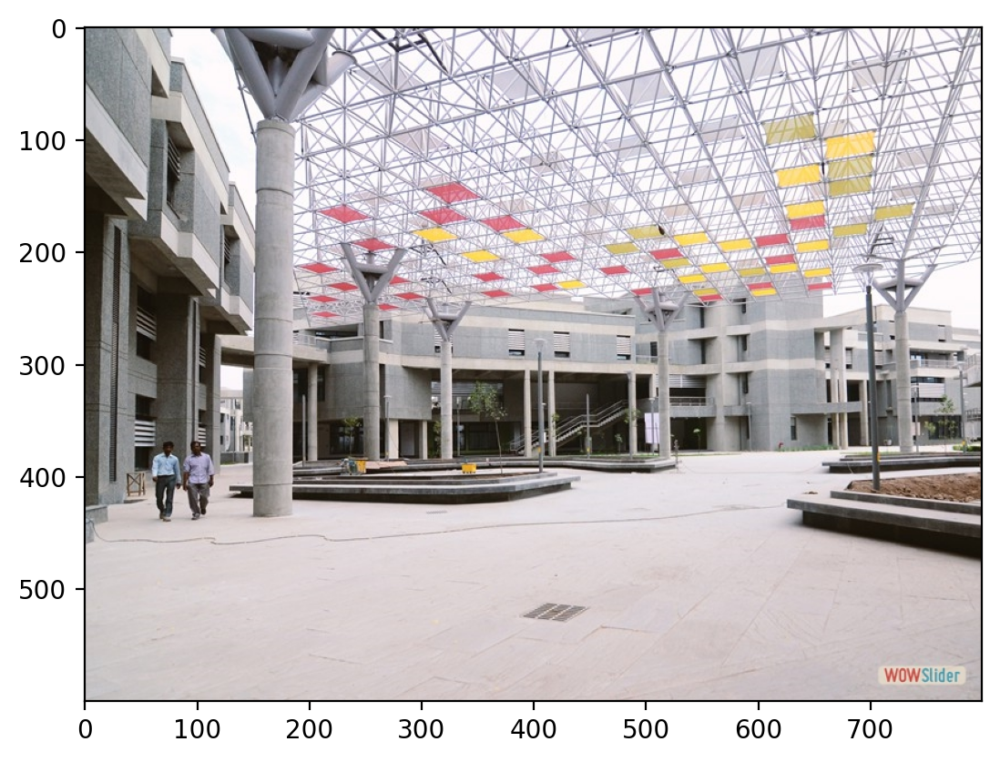

In [73]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [74]:
from sklearn import preprocessing
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [75]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

(3, 600, 800)

In [76]:
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.4275, 0.4706, 0.4706,  ..., 0.8549, 0.6039, 0.8196],
         [0.5176, 0.4980, 0.5490,  ..., 0.8314, 0.6510, 1.0000],
         [0.5176, 0.4941, 0.5529,  ..., 0.7176, 0.7216, 0.9922],
         ...,
         [0.7922, 0.7843, 0.7608,  ..., 0.7137, 0.7333, 0.7490],
         [0.7961, 0.7843, 0.7686,  ..., 0.7373, 0.7608, 0.7765],
         [0.6510, 0.6588, 0.6745,  ..., 0.6784, 0.6902, 0.6980]],

        [[0.4549, 0.4980, 0.4980,  ..., 0.8353, 0.5843, 0.8000],
         [0.5451, 0.5255, 0.5765,  ..., 0.8157, 0.6314, 0.9922],
         [0.5451, 0.5216, 0.5804,  ..., 0.7098, 0.7059, 0.9882],
         ...,
         [0.7765, 0.7686, 0.7529,  ..., 0.6784, 0.6980, 0.7137],
         [0.7804, 0.7686, 0.7529,  ..., 0.7020, 0.7255, 0.7412],
         [0.6353, 0.6431, 0.6588,  ..., 0.6431, 0.6549, 0.6627]],

        [[0.4784, 0.5216, 0.5216,  ..., 0.8235, 0.5686, 0.7843],
         [0.5686, 0.5490, 0.6000,  ..., 0.8039, 0.6196, 0.9804],
         [0.5686, 0.5451, 0.6039,  ..., 0.7137, 0.7098, 0.

In [77]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 150, 0, 300, 300)
crop.shape

torch.Size([3, 300, 300])

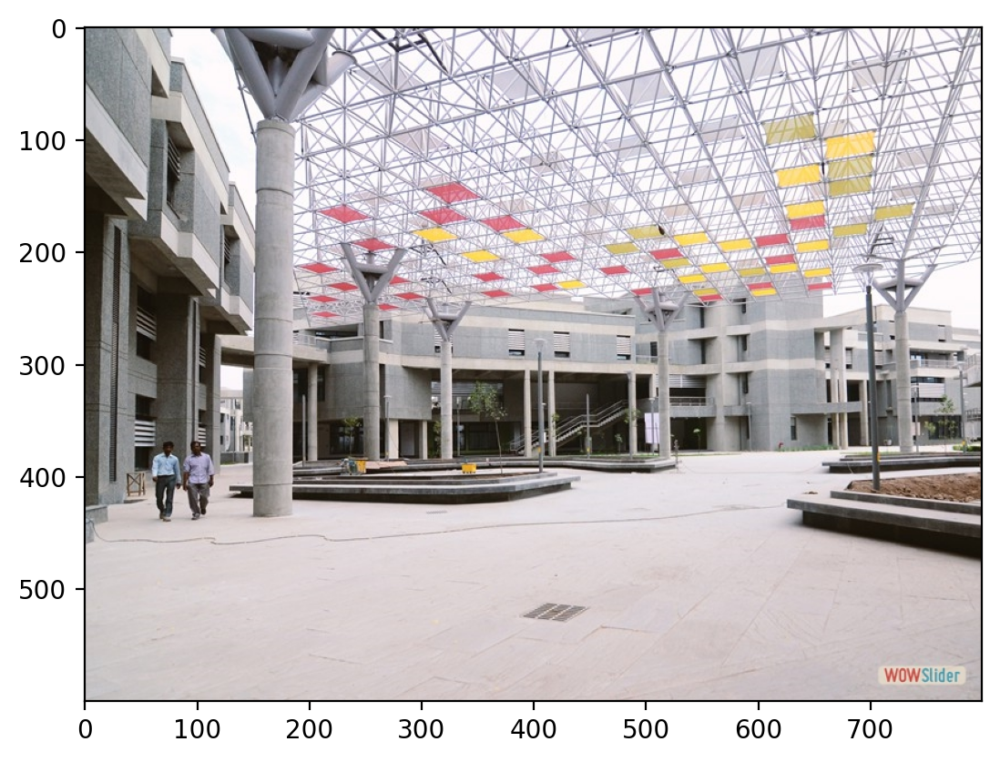

In [78]:
plt.imshow(rearrange(img, 'c h w -> h w c').cpu().numpy())


In [79]:
crop = crop.to(device)

# Get the dimensions of the image tensor
num_channels, height, width = crop.shape
print(num_channels, height, width)

3 300 300


In [80]:
def create_coordinate_map(img, scale = 1):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Scale the dimensions of the image
    height = int(height * scale)
    width = int(width * scale)

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> h w c').float()
    return X, Y

In [81]:
samvad_X, samvad_Y = create_coordinate_map(crop)

# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(samvad_X.cpu())

# Scale the X coordinates
samvad_X_scaled = scaler_X.transform(samvad_X.cpu())

# Move the scaled X coordinates to the GPU
samvad_X_scaled = torch.tensor(samvad_X_scaled).to(device)

# Set to dtype float32
samvad_X_scaled = samvad_X_scaled.float()

In [82]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [83]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [84]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()

In [85]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    """
    X: torch.Tensor of shape (num_samples, 2)
    num_features: int
    sigma: float
    """
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state=1)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device), rff

In [86]:
import gc
gc.collect()

7283

In [87]:
X_rff, rff = create_rff_features(samvad_X_scaled, 35000, 0.008)
X_rff.shape

torch.Size([90000, 35000])

In [88]:
samvad_Y = samvad_Y.view(-1, 3)  # Shape becomes (90000, 3)
samvad_Y.shape

torch.Size([90000, 3])

In [89]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.02, X_rff, samvad_Y, 2500)

Epoch 0 loss: 0.331140
Epoch 100 loss: 0.008856
Epoch 200 loss: 0.003459
Epoch 300 loss: 0.002406
Epoch 400 loss: 0.002242
Epoch 500 loss: 0.002211
Epoch 600 loss: 0.002198
Epoch 700 loss: 0.002189
Epoch 800 loss: 0.002182
Epoch 900 loss: 0.002177
Epoch 1000 loss: 0.002173
Epoch 1100 loss: 0.002169
Epoch 1200 loss: 0.002166
Epoch 1300 loss: 0.002163
Epoch 1400 loss: 0.002161
Epoch 1500 loss: 0.002159
Epoch 1600 loss: 0.002157
Epoch 1700 loss: 0.002155
Epoch 1800 loss: 0.002154
Epoch 1900 loss: 0.002152
Epoch 2000 loss: 0.002151
Epoch 2100 loss: 0.002150
Epoch 2200 loss: 0.002149
Epoch 2300 loss: 0.002148
Epoch 2400 loss: 0.002147


0.0021457138936966658

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09166419..1.1213145].


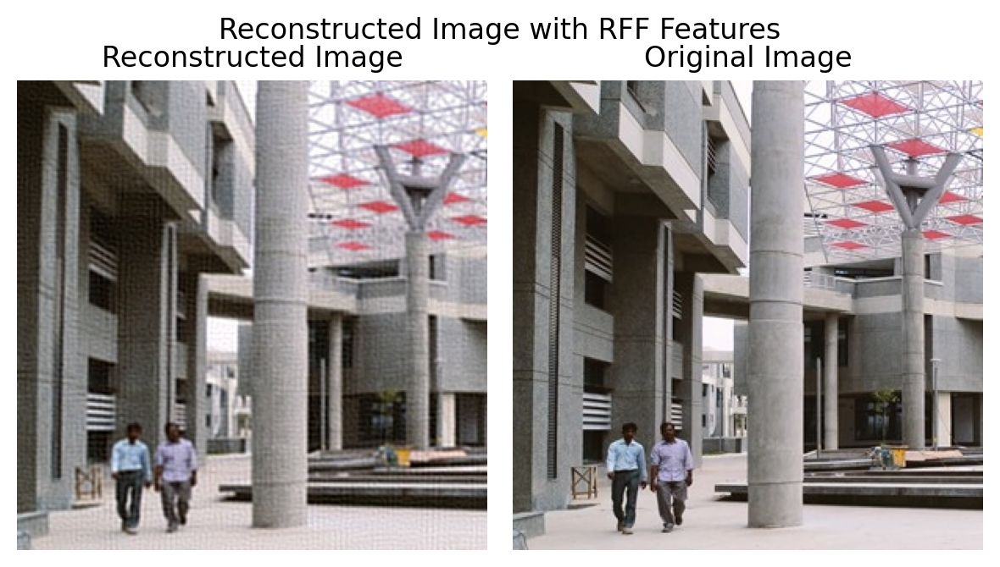

In [90]:
 plot_reconstructed_and_original_image(crop, net, X_rff, title="Reconstructed Image with RFF Features")

In [91]:
# Handle CUDA memory issues
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
torch.cuda.empty_cache()

net.half()

# Ensure samvad_X_transformed is on the right device
samvad_X_transformed = torch.tensor(rff.transform(samvad_X_scaled.cpu().numpy()), dtype=torch.float16).to(device)

# Model inference and moving predictions to the appropriate device
samvad_X_pred = net(samvad_X_transformed).to(device)

# Ensure the predicted output can be reshaped to the same shape as 'crop'
samvad_X_pred_reshaped = samvad_X_pred.reshape(crop.shape).to(device)

# Ensure 'crop' is on the same device (usually GPU)
crop = crop.to(device)

# Check the shapes of 'crop' and 'samvad_X_pred_reshaped'
crop.shape, samvad_X_pred_reshaped.shape

(torch.Size([3, 300, 300]), torch.Size([3, 300, 300]))

In [92]:
# Normalize the predicted image tensor to [0, 1]
def normalize_0_1(tensor):
    min_val = tensor.min()
    max_val = tensor.max()
    # Apply min-max normalization
    tensor_normalized = (tensor - min_val) / (max_val - min_val)
    return tensor_normalized

# Normalize the predicted image
samvad_X_pred_normalized = normalize_0_1(samvad_X_pred_reshaped)

# Check the minimum and maximum values after normalization
print(f"Min value: {samvad_X_pred_normalized.min().item():.6f}")
print(f"Max value: {samvad_X_pred_normalized.max().item():.6f}")

Min value: 0.000000
Max value: 1.000000


In [93]:
def psnr(original, reconstructed):
    mse = mean_squared_error(original, reconstructed)
    if mse == 0:  # Means no noise in the image
        return 100
    pixel_max = 1.0  # Assuming pixel values are normalized between 0 and 1
    return 20 * np.log10(pixel_max / np.sqrt(mse))

In [94]:
# Define MSE
mse_loss = nn.MSELoss()

# Compute MSE
mse = mse_loss(samvad_X_pred_normalized, crop)

# Compute PSNR
psnr_value = psnr(crop.cpu().flatten().detach().numpy(), samvad_X_pred_normalized.cpu().flatten().detach().numpy())

print(f"RMSE: {mse.item()**0.5:.6f}")
print(f"PSNR: {psnr_value:.6f} dB")

RMSE: 0.324464
PSNR: 9.776668 dB


***Part B - Audio Reconstruction Using Linear Regression and Random Fourier Features***

In [95]:
import soundfile
import torchaudio
from IPython.display import Audio

In [96]:
# Importing the audio file

audio, sample_rate = torchaudio.load("/kaggle/input/assignment2-files/audio.mp3")
print(audio.shape)
print(sample_rate)

torch.Size([2, 1715328])
44100


In [97]:
audio = audio[0]
time = audio.shape[0] / sample_rate
print(f"Audio length: {time} seconds")

Audio length: 38.89632653061224 seconds


In [98]:
# Trimming the audio file down to first 5 seconds

audio = audio[:int(5*sample_rate)]
time = audio.shape[0] / sample_rate
print(f"Audio length: {time} seconds")

Audio length: 5.0 seconds


In [99]:
audio, audio.max(), audio.min()

(tensor([0.0000, 0.0000, 0.0000,  ..., 0.0140, 0.0093, 0.0051]),
 tensor(0.9792),
 tensor(-0.9828))

In [100]:
def plot_audio(audio, sample_rate, color, title):
    plt.figure(figsize=(15, 5))
    plt.plot(audio, color = color, alpha = 0.7)
    plt.xticks(np.arange(0, audio.shape[0], sample_rate), np.arange(0, audio.shape[0] / sample_rate, 1))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(title)
    plt.grid()
    plt.show()

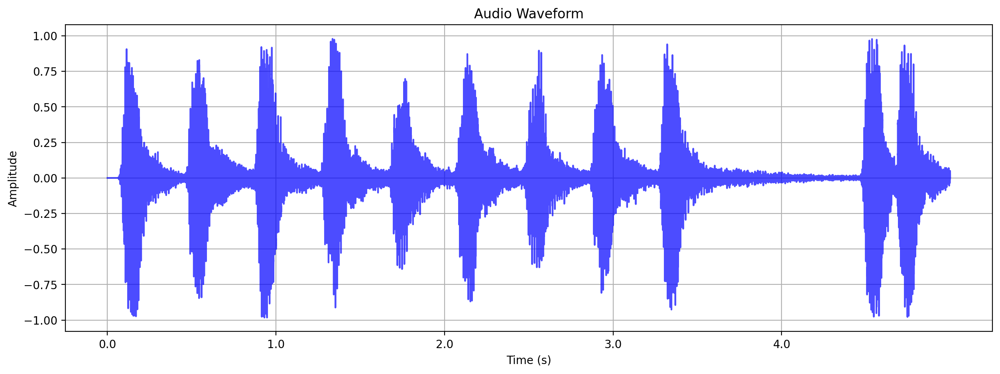

In [101]:
plot_audio(audio, sample_rate, 'blue', 'Audio Waveform')

In [102]:
# Shifting the domain of the time series to [-100,100]

X = torch.arange(0, len(audio)).unsqueeze(1).float()
X = X/X.max()*200-100
print(X.shape)
print(X)

torch.Size([220500, 1])
tensor([[-100.0000],
        [ -99.9991],
        [ -99.9982],
        ...,
        [  99.9982],
        [  99.9991],
        [ 100.0000]])


In [103]:
Audio(audio, rate = sample_rate)

In [104]:
num_features = 15000
sigma = 0.008

X_rff, _ = create_rff_features(X, num_features, sigma)
print(X_rff.shape)
print(X_rff)

torch.Size([220500, 15000])
tensor([[-1.9133e-03, -6.7937e-04,  1.1363e-02,  ...,  5.6877e-03,
          1.0788e-03,  1.9592e-04],
        [ 1.9783e-04, -1.4763e-03,  1.1466e-02,  ...,  4.8861e-03,
         -9.2374e-05, -1.1417e-04],
        [ 2.3244e-03, -2.2662e-03,  1.1527e-02,  ...,  4.0546e-03,
         -1.2514e-03, -4.2417e-04],
        ...,
        [-1.4903e-03, -6.1073e-03, -1.1465e-02,  ...,  5.0081e-03,
          2.0608e-06,  1.0784e-02],
        [ 6.7017e-04, -6.7761e-03, -1.1527e-02,  ...,  5.8146e-03,
         -1.1687e-03,  1.0668e-02],
        [ 2.7415e-03, -7.4033e-03, -1.1547e-02,  ...,  6.5662e-03,
         -2.3163e-03,  1.0547e-02]])


In [105]:
X_rff.shape, audio.shape

(torch.Size([220500, 15000]), torch.Size([220500]))

In [106]:
audio = audio.unsqueeze(1)  # Reshape audio to have shape (220500, 1)
audio.shape

torch.Size([220500, 1])

In [107]:
model = LinearRegression()
model.fit(X_rff.cpu().numpy(), audio.cpu().numpy())

pred_audio = model.predict(X_rff.cpu().numpy())
print(pred_audio.shape)

(220500, 1)


In [108]:
print(pred_audio)
print(audio)

[[-0.06406021]
 [-0.03737259]
 [-0.00076675]
 ...
 [ 0.02299118]
 [ 0.01401901]
 [ 0.04903793]]
tensor([[0.0000],
        [0.0000],
        [0.0000],
        ...,
        [0.0140],
        [0.0093],
        [0.0051]])


In [109]:
# Finding reconstruction losses (L1 and L2 Norms)

np.linalg.norm(pred_audio - audio.numpy()), np.linalg.norm((pred_audio - audio.numpy()), ord = 1)

(23.918596, 7295.8257)

In [110]:
print(pred_audio.shape)

(220500, 1)


In [111]:
pred_audio = pred_audio.squeeze()
print(pred_audio.shape)

# Normalize the predicted audio to [-1, 1] range
pred_audio = pred_audio / np.max(np.abs(pred_audio))

# # Convert to NumPy array if it's still a tensor
# pred_audio = pred_audio.cpu().numpy()

Audio(pred_audio, rate=sample_rate)

(220500,)


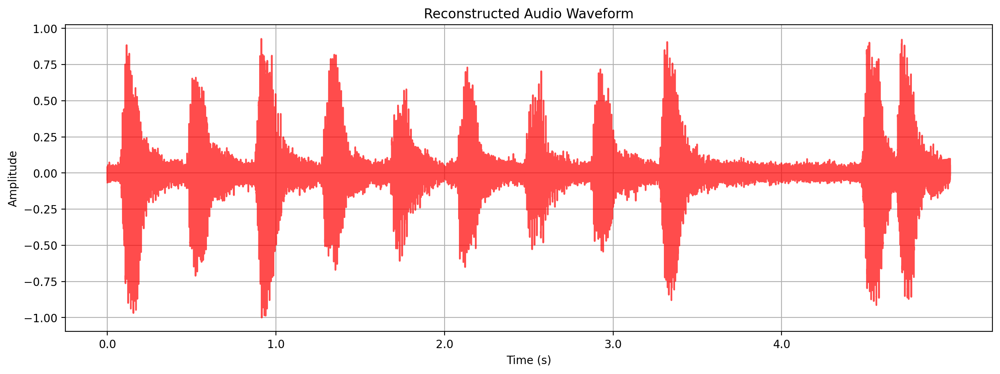

In [112]:
plot_audio(pred_audio, sample_rate, 'red', 'Reconstructed Audio Waveform')

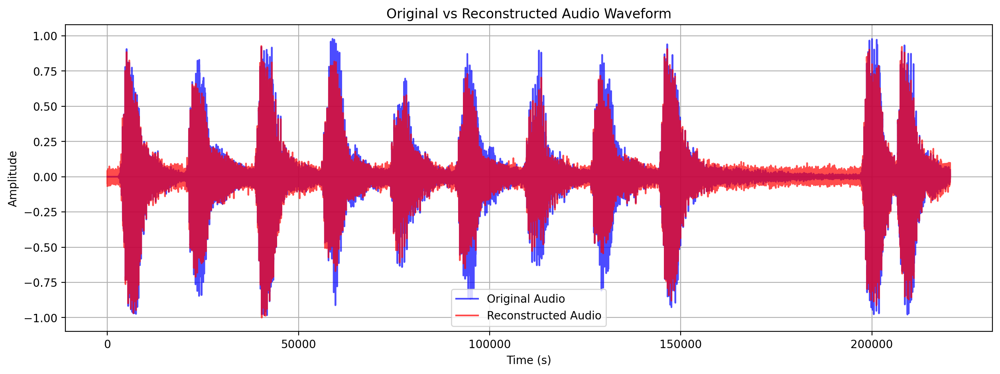

In [113]:
# Plotting both the original and reconstructed waveforms

plt.figure(figsize=(15, 5))
plt.plot(audio, color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.plot(pred_audio, color = 'red', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()

In [114]:
def snr(original_signal, predicted_signal):
    """
    original_signal (numpy.ndarray): The original audio signal.
    predicted_signal (numpy.ndarray): The predicted or reconstructed audio signal.
    

    float: The SNR value in dB.
    """
    # Ensure inputs are numpy arrays
    original_signal = np.asarray(original_signal)
    predicted_signal = np.asarray(predicted_signal)
    
    if original_signal.shape != predicted_signal.shape:
        raise ValueError("Original and predicted signals must have the same shape.")
    
    noise = original_signal - predicted_signal
    signal_power = np.mean(np.square(original_signal))
    noise_power = np.mean(np.square(noise))
    
    # Avoid division by zero
    if noise_power == 0:
        raise ValueError("Noise power is zero. SNR is undefined.")
    
    # Calculate SNR
    snr = 10 * np.log10(signal_power / noise_power)
    
    return snr

In [115]:
audio_arr = audio.cpu().numpy()
audio_arr = audio_arr.squeeze()
audio_arr.shape

(220500,)

In [116]:
RMSE = mean_squared_error(audio, pred_audio)**0.5
SNR = snr(audio_arr, pred_audio)

print("RMSE =", RMSE)
print("SNR =", SNR, "dB")

RMSE = 0.05109317739483728
SNR = 10.830538272857666 dB


# **Task 3** - Super-Resolution using Random Fourier Features (RFF)

In [117]:
# Importing the image
dog = torchvision.io.read_image("/kaggle/input/assignment2-files/dog.jpg")
print(dog.shape)

torch.Size([3, 1365, 2048])


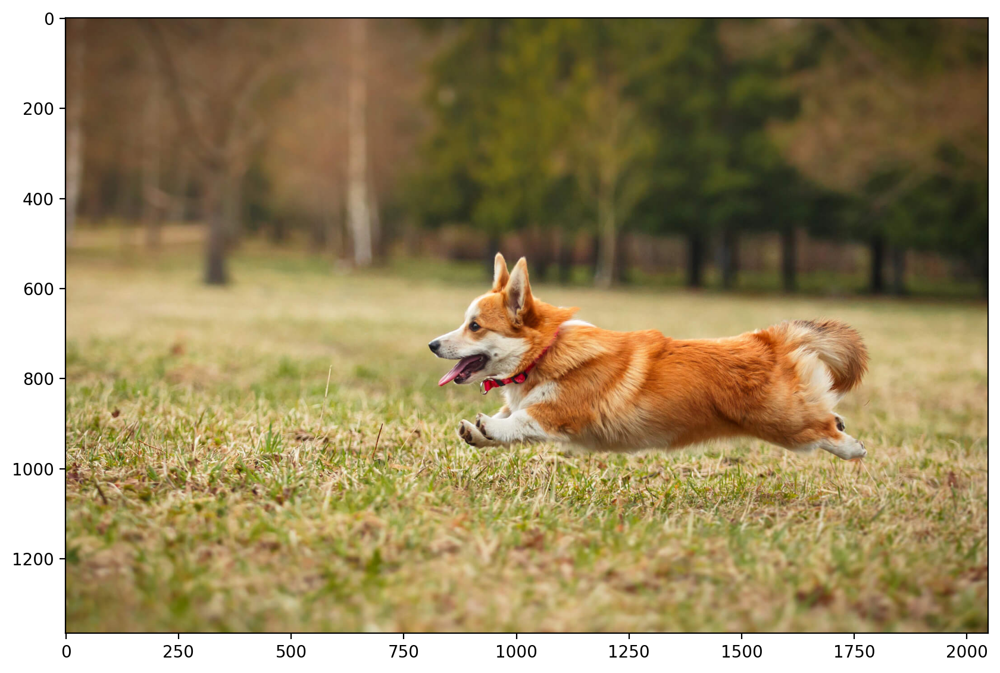

In [118]:
plt.figure(figsize=(10, 10))
plt.imshow(rearrange(dog, 'c h w -> h w c').numpy())

In [119]:
# Scaling the image
scaler = preprocessing.MinMaxScaler().fit(dog.reshape(-1, 1))
scaler

MinMaxScaler()

In [120]:
scaled_dog = scaler.transform(dog.reshape(-1, 1)).reshape(dog.shape)
scaled_dog = torch.tensor(scaled_dog).float().to(device)
print(scaled_dog.shape)
print(scaled_dog)
print(scaled_dog.max(), scaled_dog.min())

torch.Size([3, 1365, 2048])
tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.14

In [121]:
# Cropping the original image into a 400x400 resolution
dog_400 = transforms.functional.crop(scaled_dog.cpu(), 500, 800, 400, 400)
dog_400.shape

torch.Size([3, 400, 400])

In [122]:
dog_400

tensor([[[0.4549, 0.4549, 0.4549,  ..., 0.3882, 0.3961, 0.4000],
         [0.4588, 0.4588, 0.4588,  ..., 0.3882, 0.3961, 0.4000],
         [0.4588, 0.4588, 0.4588,  ..., 0.3882, 0.3961, 0.4000],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5216, 0.5569, 0.6118],
         [0.8471, 0.7843, 0.7451,  ..., 0.5216, 0.5569, 0.6039],
         [0.8784, 0.8196, 0.7686,  ..., 0.5059, 0.5373, 0.5804]],

        [[0.3333, 0.3333, 0.3333,  ..., 0.3216, 0.3294, 0.3333],
         [0.3373, 0.3373, 0.3373,  ..., 0.3216, 0.3294, 0.3333],
         [0.3373, 0.3373, 0.3373,  ..., 0.3216, 0.3294, 0.3333],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.3608, 0.4000, 0.4549],
         [0.8157, 0.7569, 0.7137,  ..., 0.3608, 0.3961, 0.4471],
         [0.8431, 0.7882, 0.7333,  ..., 0.3529, 0.3882, 0.4314]],

        [[0.2235, 0.2235, 0.2235,  ..., 0.2196, 0.2196, 0.2235],
         [0.2275, 0.2275, 0.2275,  ..., 0.2196, 0.2196, 0.2235],
         [0.2275, 0.2275, 0.2275,  ..., 0.2196, 0.2196, 0.

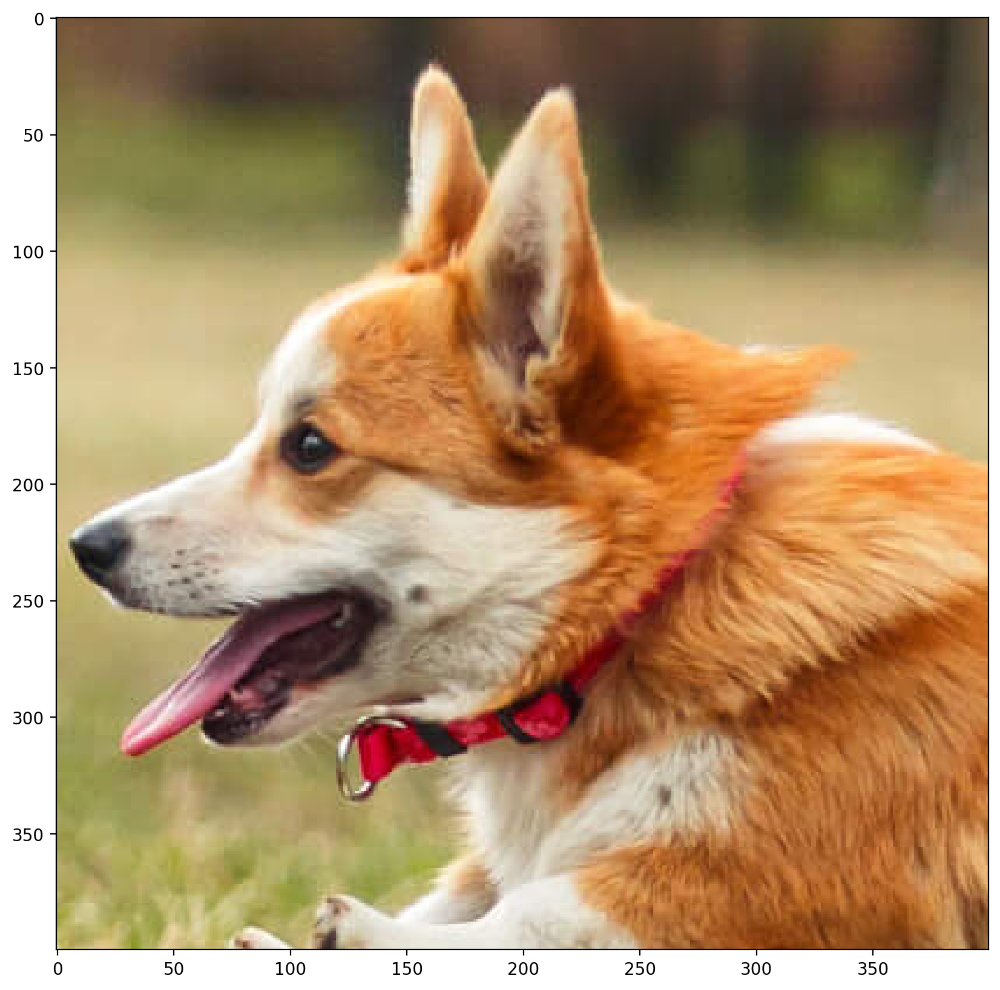

In [123]:
plt.figure(figsize=(10, 10))
plt.imshow(rearrange(dog_400, 'c h w -> h w c').cpu().numpy())

(200, 200, 3)


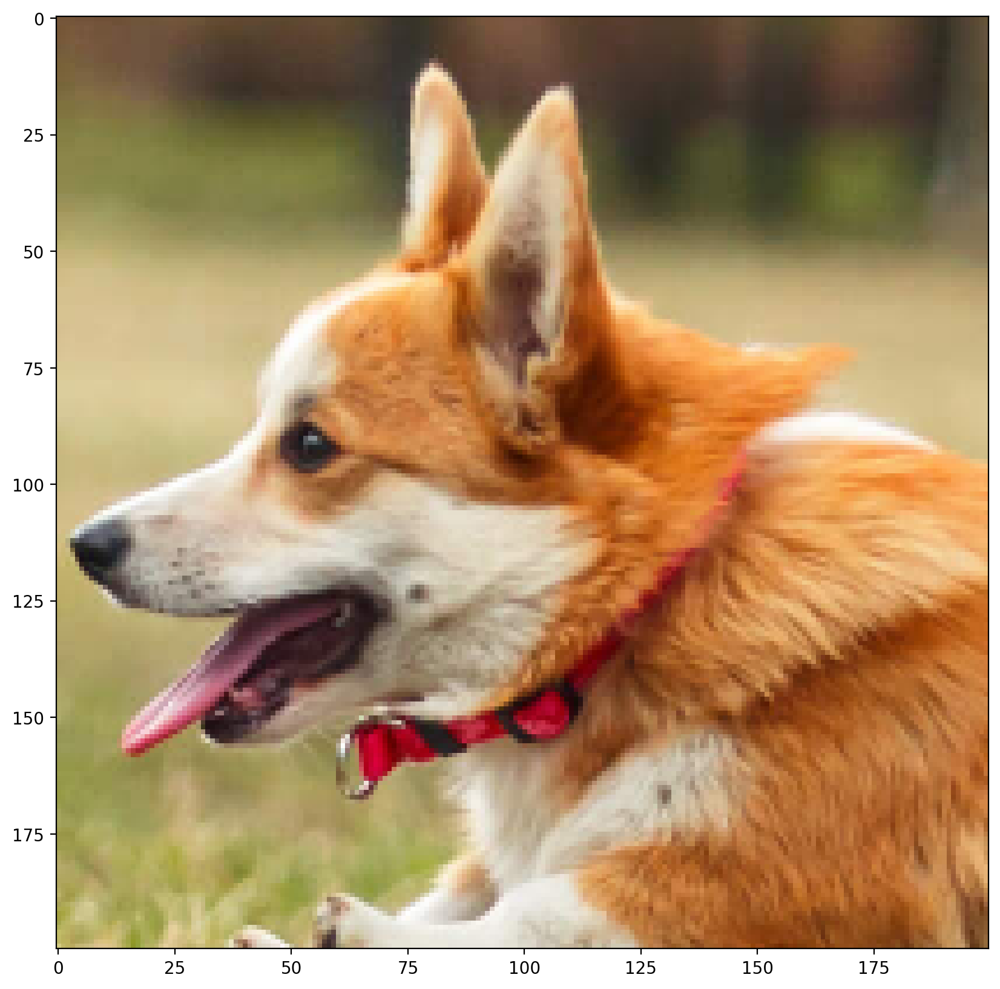

In [124]:
# Resizing the 400x400 to a 200x200 image

import cv2

dog_200 = rearrange(dog_400, 'c h w -> h w c').numpy()
dog_200 = cv2.resize(dog_200, (int(dog_200.shape[1]*0.5), int(dog_200.shape[0]*0.5)), interpolation = cv2.INTER_AREA)
print(dog_200.shape)
plt.figure(figsize=(10, 10))
plt.imshow(dog_200)

In [125]:
dog_200

array([[[0.45686275, 0.33529413, 0.2254902 ],
        [0.45686275, 0.33529413, 0.2254902 ],
        [0.45686275, 0.33529413, 0.2254902 ],
        ...,
        [0.36078432, 0.2901961 , 0.2       ],
        [0.38235295, 0.3137255 , 0.21568628],
        [0.39803922, 0.33137256, 0.22156863]],

       [[0.45882353, 0.3372549 , 0.22745098],
        [0.45882353, 0.3372549 , 0.22745098],
        [0.45882353, 0.3372549 , 0.22745098],
        ...,
        [0.36078432, 0.2901961 , 0.2       ],
        [0.38235295, 0.3137255 , 0.21568628],
        [0.39803922, 0.33137256, 0.22156863]],

       [[0.45686275, 0.33529413, 0.21372549],
        [0.46078432, 0.3392157 , 0.21764706],
        [0.46862745, 0.34705883, 0.2254902 ],
        ...,
        [0.34901962, 0.29607844, 0.21176471],
        [0.3764706 , 0.3137255 , 0.23333333],
        [0.39803922, 0.327451  , 0.24901962]],

       ...,

       [[0.7588236 , 0.7313726 , 0.39607844],
        [0.72745097, 0.6901961 , 0.37058824],
        [0.7264706 , 0

In [126]:
# Converting the 200x200 back to a torch.Tensor object
dog_200 = torch.tensor(dog_200, dtype=torch.float16).permute(2,0,1).to(device)
print(dog_200.shape)
print(dog_200.min(), dog_200.max())
dog_200

torch.Size([3, 200, 200])
tensor(0., dtype=torch.float16) tensor(1., dtype=torch.float16)


tensor([[[0.4568, 0.4568, 0.4568,  ..., 0.3608, 0.3823, 0.3979],
         [0.4587, 0.4587, 0.4587,  ..., 0.3608, 0.3823, 0.3979],
         [0.4568, 0.4607, 0.4685,  ..., 0.3491, 0.3765, 0.3979],
         ...,
         [0.7588, 0.7275, 0.7266,  ..., 0.4941, 0.5215, 0.5825],
         [0.7500, 0.7334, 0.7393,  ..., 0.4500, 0.5186, 0.5864],
         [0.8325, 0.7578, 0.7363,  ..., 0.4019, 0.5010, 0.5698]],

        [[0.3352, 0.3352, 0.3352,  ..., 0.2903, 0.3137, 0.3313],
         [0.3372, 0.3372, 0.3372,  ..., 0.2903, 0.3137, 0.3313],
         [0.3352, 0.3391, 0.3472,  ..., 0.2961, 0.3137, 0.3274],
         ...,
         [0.7314, 0.6904, 0.6724,  ..., 0.3157, 0.3452, 0.4058],
         [0.7236, 0.6992, 0.6963,  ..., 0.2803, 0.3530, 0.4255],
         [0.8008, 0.7207, 0.6914,  ..., 0.2402, 0.3430, 0.4158]],

        [[0.2255, 0.2255, 0.2255,  ..., 0.2000, 0.2157, 0.2216],
         [0.2274, 0.2274, 0.2274,  ..., 0.2000, 0.2157, 0.2216],
         [0.2137, 0.2177, 0.2255,  ..., 0.2118, 0.2333, 0.

In [127]:
import gc

gc.collect()

6920

In [128]:
# Creating the Coordinate Map of the 200x200 image
X, Y = create_coordinate_map(dog_200)
print("Shape of X =", X.shape, "\nShape of Y =", Y.shape)
print("X:\n", X, "\nY:\n", Y)

Shape of X = torch.Size([40000, 2]) 
Shape of Y = torch.Size([200, 200, 3])
X:
 tensor([[  0.,   0.],
        [  0.,   1.],
        [  0.,   2.],
        ...,
        [199., 197.],
        [199., 198.],
        [199., 199.]]) 
Y:
 tensor([[[0.4568, 0.3352, 0.2255],
         [0.4568, 0.3352, 0.2255],
         [0.4568, 0.3352, 0.2255],
         ...,
         [0.3608, 0.2903, 0.2000],
         [0.3823, 0.3137, 0.2157],
         [0.3979, 0.3313, 0.2216]],

        [[0.4587, 0.3372, 0.2274],
         [0.4587, 0.3372, 0.2274],
         [0.4587, 0.3372, 0.2274],
         ...,
         [0.3608, 0.2903, 0.2000],
         [0.3823, 0.3137, 0.2157],
         [0.3979, 0.3313, 0.2216]],

        [[0.4568, 0.3352, 0.2137],
         [0.4607, 0.3391, 0.2177],
         [0.4685, 0.3472, 0.2255],
         ...,
         [0.3491, 0.2961, 0.2118],
         [0.3765, 0.3137, 0.2333],
         [0.3979, 0.3274, 0.2490]],

        ...,

        [[0.7588, 0.7314, 0.3960],
         [0.7275, 0.6904, 0.3706],
       

In [129]:
# Scaling X using Min-Max Scaler
scaler = preprocessing.MinMaxScaler().fit(X.cpu())
scaled_X = torch.tensor(scaler.transform(X.cpu())).float().to(device)
print(scaled_X.shape)
print(scaled_X)

torch.Size([40000, 2])
tensor([[0.0000, 0.0000],
        [0.0000, 0.0050],
        [0.0000, 0.0101],
        ...,
        [1.0000, 0.9899],
        [1.0000, 0.9950],
        [1.0000, 1.0000]])


In [130]:
# Creating Random Fouruer Features (RFF) of the 200x200 scaled_X

X_rff, rff = create_rff_features(scaled_X, 30000, 0.008)
X_rff.shape

torch.Size([40000, 30000])

In [131]:
# Training the Linear Model on the Random Fourier Features

net = LinearModel(X_rff.shape[1], 3).to(device)
net

LinearModel(
  (linear): Linear(in_features=30000, out_features=3, bias=True)
)

In [132]:
Y = Y.view(-1, 3)  # Reshape Y to (40000, 3)

In [133]:
Y = Y.to(device)
train(net, 0.02, X_rff, Y, 2000)

Epoch 0 loss: 0.313294
Epoch 100 loss: 0.000548
Epoch 200 loss: 0.000498
Epoch 300 loss: 0.000492
Epoch 400 loss: 0.000489
Epoch 500 loss: 0.000487
Epoch 600 loss: 0.000485
Epoch 700 loss: 0.000484
Epoch 800 loss: 0.000483
Epoch 900 loss: 0.000483
Epoch 1000 loss: 0.000482
Epoch 1100 loss: 0.000482
Epoch 1200 loss: 0.000481
Epoch 1300 loss: 0.000481
Epoch 1400 loss: 0.000481
Epoch 1500 loss: 0.000480
Epoch 1600 loss: 0.000480
Epoch 1700 loss: 0.000480
Epoch 1800 loss: 0.000480
Epoch 1900 loss: 0.000480


0.000479156180517748

In [134]:
import gc
del X_rff, X, Y, scaled_X
gc.collect()

0

In [135]:
# Creating the Coordinate Map for the Super-Resolution Image (2x Scaled: 400 x 400)

X_2, Y_2 = create_coordinate_map(dog_200, scale = 2)
print("Shape of X_2 =", X_2.shape, "\nShape of Y_2 =", Y_2.shape)
print("X_2:\n", X_2,"\nY_2:\n", Y_2)

Shape of X_2 = torch.Size([160000, 2]) 
Shape of Y_2 = torch.Size([200, 200, 3])
X_2:
 tensor([[  0.,   0.],
        [  0.,   1.],
        [  0.,   2.],
        ...,
        [399., 397.],
        [399., 398.],
        [399., 399.]]) 
Y_2:
 tensor([[[0.4568, 0.3352, 0.2255],
         [0.4568, 0.3352, 0.2255],
         [0.4568, 0.3352, 0.2255],
         ...,
         [0.3608, 0.2903, 0.2000],
         [0.3823, 0.3137, 0.2157],
         [0.3979, 0.3313, 0.2216]],

        [[0.4587, 0.3372, 0.2274],
         [0.4587, 0.3372, 0.2274],
         [0.4587, 0.3372, 0.2274],
         ...,
         [0.3608, 0.2903, 0.2000],
         [0.3823, 0.3137, 0.2157],
         [0.3979, 0.3313, 0.2216]],

        [[0.4568, 0.3352, 0.2137],
         [0.4607, 0.3391, 0.2177],
         [0.4685, 0.3472, 0.2255],
         ...,
         [0.3491, 0.2961, 0.2118],
         [0.3765, 0.3137, 0.2333],
         [0.3979, 0.3274, 0.2490]],

        ...,

        [[0.7588, 0.7314, 0.3960],
         [0.7275, 0.6904, 0.3706]

In [136]:
# Scaling X using Min-Max Scaler

scaler = preprocessing.MinMaxScaler().fit(X_2.cpu())
scaled_X_2 = torch.tensor(scaler.transform(X_2.cpu())).float().to(device)
print(scaled_X_2.shape)
print(scaled_X_2)

torch.Size([160000, 2])
tensor([[0.0000, 0.0000],
        [0.0000, 0.0025],
        [0.0000, 0.0050],
        ...,
        [1.0000, 0.9950],
        [1.0000, 0.9975],
        [1.0000, 1.0000]])


In [137]:
# Transforming the scaled_X to the Random Fourier Features

X_rff = rff.transform(scaled_X_2.cpu().numpy())
X_rff = torch.tensor(X_rff).float().to(device)
print(X_rff.shape)
print(X_rff)

torch.Size([160000, 30000])
tensor([[-0.0068, -0.0048, -0.0027,  ...,  0.0079, -0.0071, -0.0079],
        [-0.0062, -0.0058, -0.0055,  ...,  0.0077, -0.0070, -0.0082],
        [-0.0056, -0.0066, -0.0074,  ...,  0.0049, -0.0069, -0.0081],
        ...,
        [-0.0078, -0.0067, -0.0006,  ..., -0.0073,  0.0054,  0.0067],
        [-0.0074, -0.0073, -0.0038,  ..., -0.0039,  0.0052,  0.0056],
        [-0.0069, -0.0078, -0.0063,  ...,  0.0007,  0.0051,  0.0044]])


In [138]:
def plot_Original_vs_Predicted_Img(OriginalImg, X_rff_pred, net, return_Output = 0):
    """
    OriginalImg: torch.Tensor of shape (num_channels, height, width)
    X_rff_pred: torch.Tensor of shape (num_samples, num_features)
    net: torch.nn.Module
    return_Output: int
    return: torch.Tensor of shape (num_channels, scale*height, scale*width)

    """
    num_channels, height, width = OriginalImg.shape

    with torch.no_grad():
        outputs = net(X_rff_pred)
        pred_img = outputs.to(device)
        print(pred_img.shape)
        pred_img = rearrange(pred_img, '(h w) c -> c h w', h=height, w=width)
    fig = plt.figure(figsize=(12,8))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax0.set_title(f'Original Image ({height}x{width})')
    ax0.imshow(rearrange(OriginalImg, 'c h w -> h w c').cpu().numpy())

    ax1 = plt.subplot(gs[1])
    ax1.set_title(f'Predicted Image ({height}x{width})')
    ax1.imshow(rearrange(pred_img,'c h w -> h w c').cpu().detach().numpy())

    fig.suptitle('Original vs Predicted Image',fontsize=16, y=0.95)
    plt.tight_layout()
    if(return_Output == 1):
        return pred_img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06406144..1.0430702].


torch.Size([160000, 3])


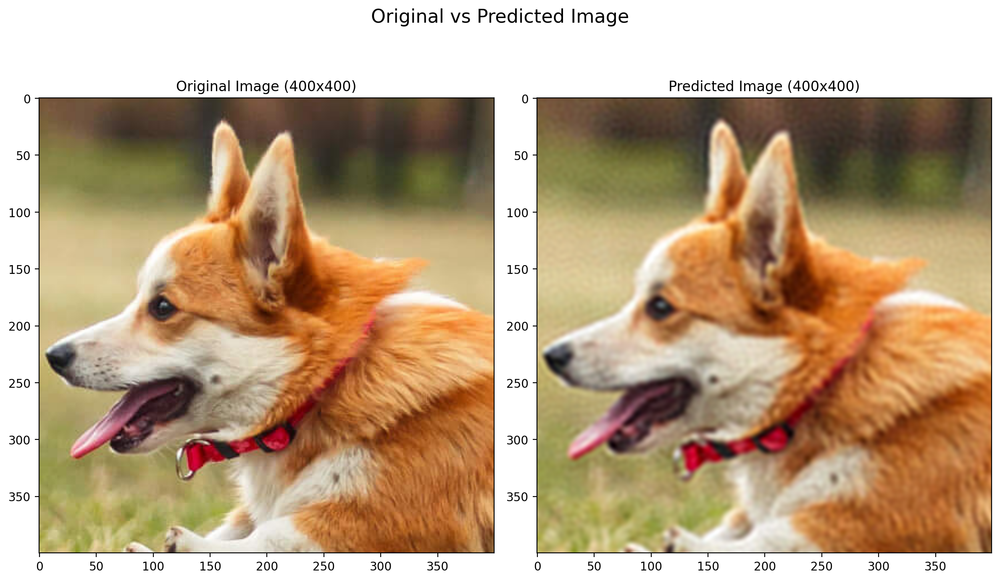

In [139]:
Y = plot_Original_vs_Predicted_Img(dog_400, X_rff, net, return_Output = 1)

In [140]:
Y = Y.to(device)
dog_400 = dog_400.to(device)

# Compute MSE
mse_loss = nn.MSELoss()
mse = mse_loss(Y, dog_400)

# Compute PSNR
psnr_value = psnr(dog_400.cpu().flatten().detach().numpy(), Y.cpu().flatten().detach().numpy())

print(f"RMSE: {mse.item()**0.5:.6f}")
print(f"PSNR: {psnr_value:.6f} dB")

RMSE: 0.027988
PSNR: 31.060445 dB
